In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator
from PIL import Image

%matplotlib inline


dbCovid = pd.read_csv("WHO-COVID-19-global-data.csv")

pd.options.display.max_rows = 80
pd.options.display.max_rows = 80

dbCovid.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 161759 entries, 0 to 161758
Data columns (total 8 columns):
 #   Column             Non-Null Count   Dtype 
---  ------             --------------   ----- 
 0   Date_reported      161759 non-null  object
 1   Country_code       161077 non-null  object
 2   Country            161759 non-null  object
 3   WHO_region         161759 non-null  object
 4   New_cases          161759 non-null  int64 
 5   Cumulative_cases   161759 non-null  int64 
 6   New_deaths         161759 non-null  int64 
 7   Cumulative_deaths  161759 non-null  int64 
dtypes: int64(4), object(4)
memory usage: 9.9+ MB


In [2]:
dbCovid.describe(include = 'object')

,Date_reported,Country_code,Country,WHO_region
count,161759,161077,161759,161759
unique,683,236,237,7
top,2021-06-19,KN,Montserrat,EURO
freq,237,683,683,42284


In [3]:
dbCovid.describe(exclude = 'object')

,New_cases,Cumulative_cases,New_deaths,Cumulative_deaths
count,161759.000000,1.617590e+05,161759.000000,161759.000000
mean,1563.453564,3.833019e+05,31.496399,8678.451233
std,9437.829946,2.199117e+06,167.011306,42853.658418
min,-32952.000000,0.000000e+00,-92.000000,0.000000
25%,0.000000,6.000000e+01,0.000000,0.000000
50%,15.000000,5.472000e+03,0.000000,85.000000
75%,395.000000,9.627600e+04,6.000000,1646.000000
max,414188.000000,4.669736e+07,8786.000000,755950.000000


In [4]:
dbCovid.head()

,Date_reported,Country_code,Country,WHO_region,New_cases,Cumulative_cases,New_deaths,Cumulative_deaths
0,2020-01-03,AF,Afghanistan,EMRO,0,0,0,0
1,2020-01-04,AF,Afghanistan,EMRO,0,0,0,0
2,2020-01-05,AF,Afghanistan,EMRO,0,0,0,0
3,2020-01-06,AF,Afghanistan,EMRO,0,0,0,0
4,2020-01-07,AF,Afghanistan,EMRO,0,0,0,0


In [5]:
dbCovid.shape

(161759, 8)

In [6]:
#création de variales nombre de lignes/col/cellules utilisables plus tard
nb_row = dbCovid.shape[0]
nb_cols = dbCovid.shape[1]
nb_cells = np.product(dbCovid.shape)

In [7]:
#comptage du nombre de NAN et faire un pourcentage 
pourcentage_na = dbCovid.isna().sum().sum()/nb_cells * 100
pourcentage_na

0.0527018589382971

In [8]:
#changer toutes les valeures négative par 0

dbCovid["New_cases"] = np.where(dbCovid["New_cases"] < 0, 0, dbCovid["New_cases"])

dbCovid["New_deaths"] = np.where(dbCovid["New_deaths"] < 0, 0, dbCovid["New_deaths"])

dbCovid.describe()

,New_cases,Cumulative_cases,New_deaths,Cumulative_deaths
count,161759.000000,1.617590e+05,161759.000000,161759.000000
mean,1563.789947,3.833019e+05,31.499125,8678.451233
std,9437.377872,2.199117e+06,167.010455,42853.658418
min,0.000000,0.000000e+00,0.000000,0.000000
25%,0.000000,6.000000e+01,0.000000,0.000000
50%,15.000000,5.472000e+03,0.000000,85.000000
75%,395.000000,9.627600e+04,6.000000,1646.000000
max,414188.000000,4.669736e+07,8786.000000,755950.000000


In [9]:
#changement des NAN par 'NONE'
dbCovid.fillna(value = 'NONE' , inplace = True)

In [10]:
#theme du sns
sns.set_theme(context='notebook',style='darkgrid',palette='deep',font='sans-serif')

In [11]:
test = dbCovid['Country']
test

0         Afghanistan
1         Afghanistan
2         Afghanistan
3         Afghanistan
4         Afghanistan
             ...     
161754       Zimbabwe
161755       Zimbabwe
161756       Zimbabwe
161757       Zimbabwe
161758       Zimbabwe
Name: Country, Length: 161759, dtype: object

<AxesSubplot:xlabel='Date_reported', ylabel='New_cases'>

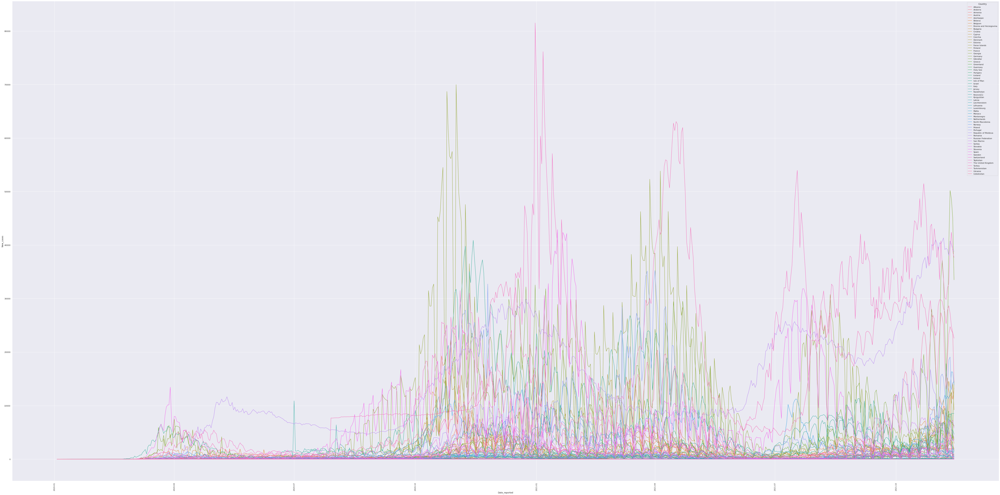

In [12]:
#Évolution de la contamination (nvx cas) en fonction de la date pour la région de l'europe

plt.figure(figsize=(100,50))
cumulative_cases_per_date_EURO = sns.lineplot(data=dbCovid , x = pd.to_datetime(dbCovid['Date_reported']) , y = dbCovid['New_cases'][dbCovid['WHO_region'] == 'EURO'] , hue = dbCovid['Country'][dbCovid['WHO_region'] == 'EURO'])
plt.xticks(rotation=90)
cumulative_cases_per_date_EURO

In [13]:
set(dbCovid['WHO_region'].values)

{'AFRO', 'AMRO', 'EMRO', 'EURO', 'Other', 'SEARO', 'WPRO'}

<AxesSubplot:xlabel='Date_reported', ylabel='New_cases'>

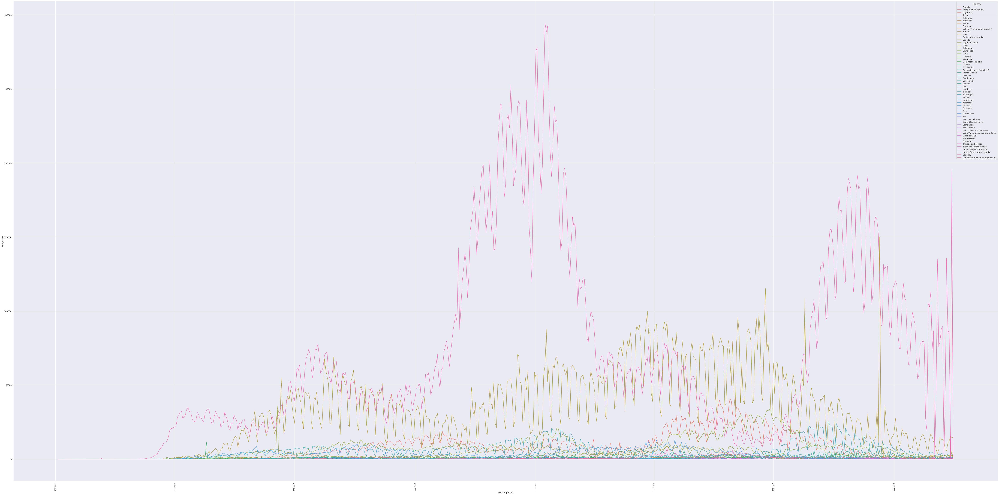

In [14]:
#Évolution de la contamination (nvx cas) en fonction de la date pour la région des Amériques

plt.figure(figsize=(100,50))
cumulative_cases_per_date_AMRO = sns.lineplot(data=dbCovid , x = pd.to_datetime(dbCovid['Date_reported']) , y = dbCovid['New_cases'][dbCovid['WHO_region'] == 'AMRO'] , hue = dbCovid['Country'][dbCovid['WHO_region'] == 'AMRO'])
plt.xticks(rotation=90)
cumulative_cases_per_date_AMRO

<AxesSubplot:xlabel='Date_reported', ylabel='New_cases'>

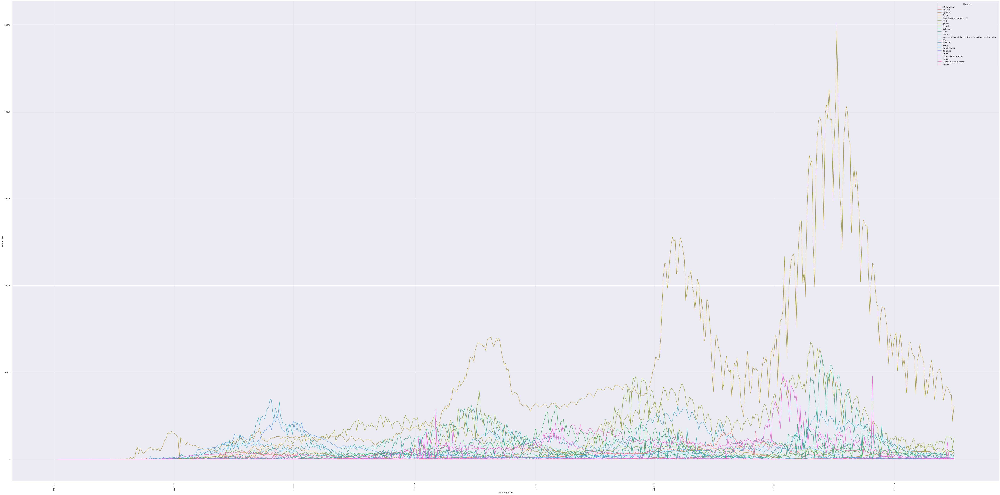

In [15]:
#Évolution de la contamination (nvx cas) en fonction de la date pour la région de Eastern Mediterranean Region


plt.figure(figsize=(100,50))
cumulative_cases_per_date_EMRO = sns.lineplot(data=dbCovid , x = pd.to_datetime(dbCovid['Date_reported']) , y = dbCovid['New_cases'][dbCovid['WHO_region'] == 'EMRO'] , hue = dbCovid['Country'][dbCovid['WHO_region'] == 'EMRO'])
plt.xticks(rotation=90)
cumulative_cases_per_date_EMRO

<AxesSubplot:xlabel='Date_reported', ylabel='New_cases'>

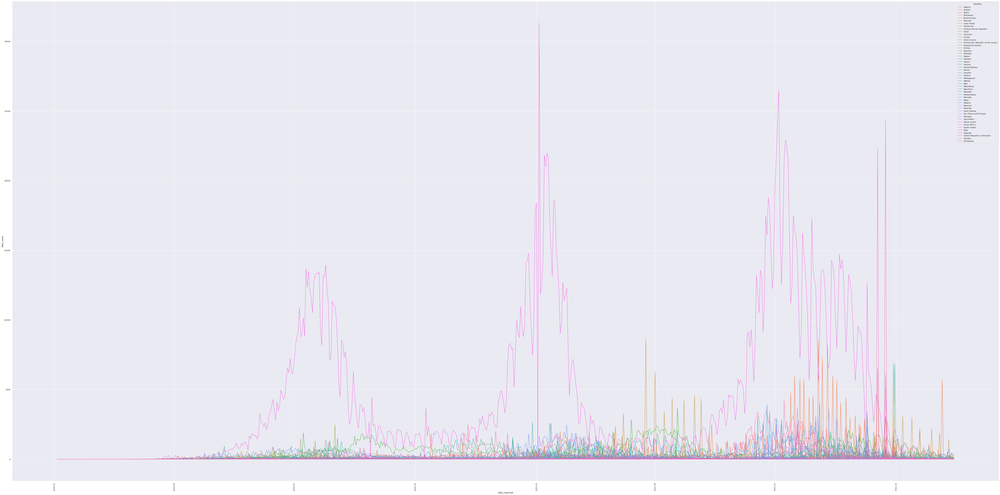

In [16]:
#Évolution de la contamination (nvx cas) en fonction de la date pour la région de l'Afrique

plt.figure(figsize=(100,50))
cumulative_cases_per_date_AFRO = sns.lineplot(data=dbCovid , x = pd.to_datetime(dbCovid['Date_reported']) , y = dbCovid['New_cases'][dbCovid['WHO_region'] == 'AFRO'] , hue = dbCovid['Country'][dbCovid['WHO_region'] == 'AFRO'])
plt.xticks(rotation=90)
cumulative_cases_per_date_AFRO

<AxesSubplot:xlabel='Date_reported', ylabel='New_cases'>

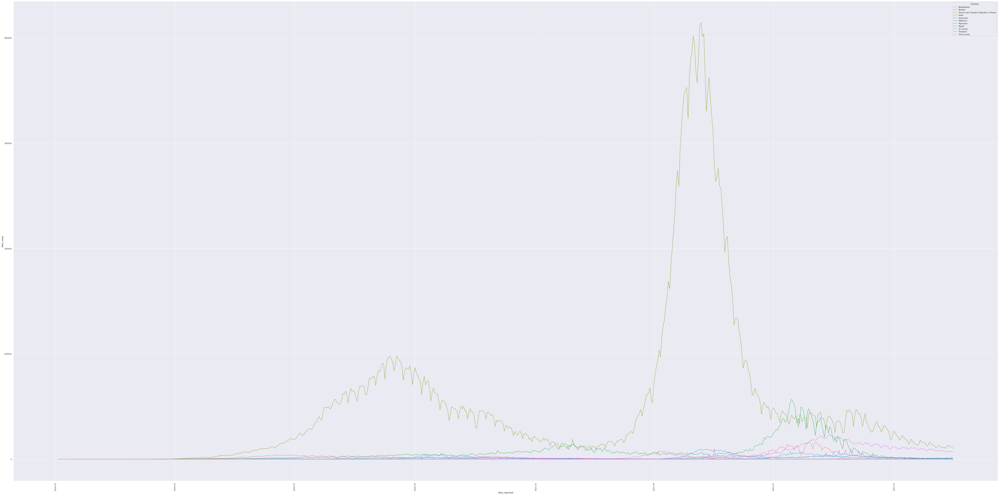

In [17]:
#Évolution de la contamination (nvx cas) en fonction de la date pour la région de South-East Asian Region

plt.figure(figsize=(100,50))
cumulative_cases_per_date_SEARO = sns.lineplot(data=dbCovid , x = pd.to_datetime(dbCovid['Date_reported']) , y = dbCovid['New_cases'][dbCovid['WHO_region'] == 'SEARO'] , hue = dbCovid['Country'][dbCovid['WHO_region'] == 'SEARO'])
plt.xticks(rotation=90)
cumulative_cases_per_date_SEARO

<AxesSubplot:xlabel='Date_reported', ylabel='New_cases'>

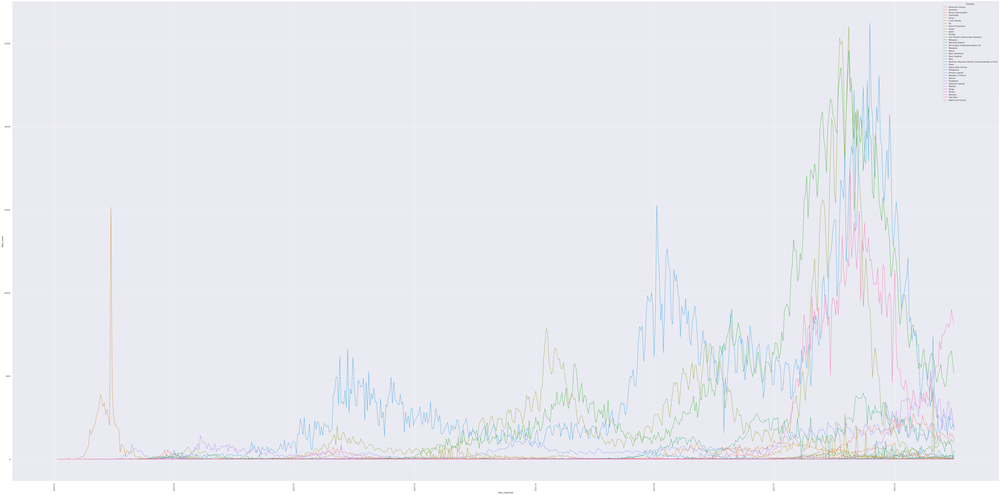

In [18]:
#Évolution de la contamination (nvx cas) en fonction de la date pour la région de Western Pacific Region (WPR)

plt.figure(figsize=(100,50))
cumulative_cases_per_date_WPRO = sns.lineplot(data=dbCovid , x = pd.to_datetime(dbCovid['Date_reported']) , y = dbCovid['New_cases'][dbCovid['WHO_region'] == 'WPRO'] , hue = dbCovid['Country'][dbCovid['WHO_region'] == 'WPRO'])
plt.xticks(rotation=90)
cumulative_cases_per_date_WPRO

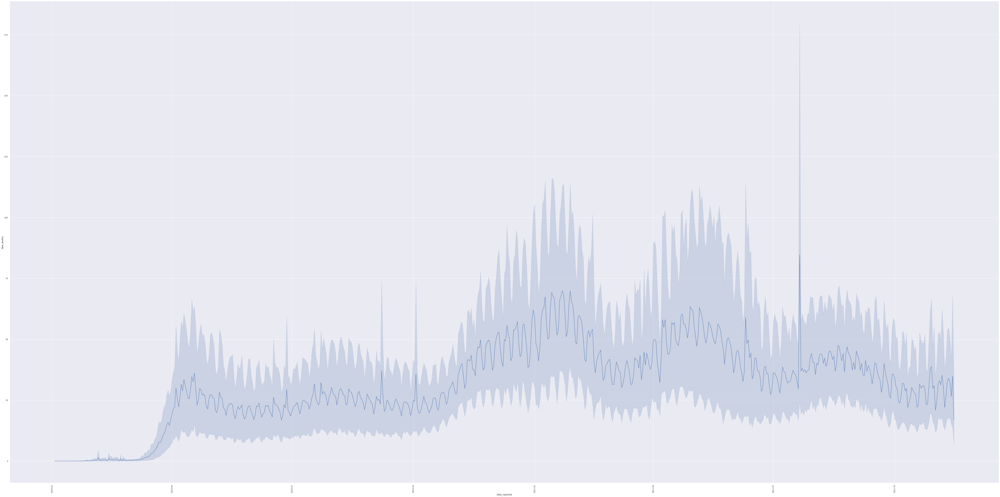

In [19]:
#Cumulative deaths per date
plt.figure(figsize=(100,50))
sns.lineplot(data=dbCovid , x = pd.to_datetime(dbCovid['Date_reported']) , y = dbCovid['New_deaths'])
plt.xticks(rotation=90)
plt.show()

<AxesSubplot:xlabel='Date_reported', ylabel='New_cases'>

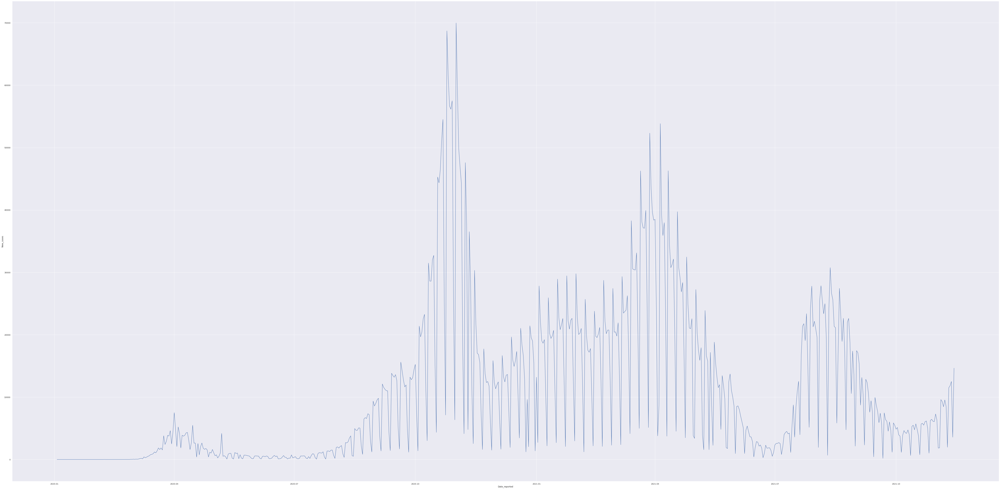

In [20]:
#Cumulative cases per date for France

plt.figure(figsize=(100,50))
sns.lineplot(data=dbCovid[dbCovid['Country'] == 'France'] , x = pd.to_datetime(dbCovid['Date_reported']) , y = dbCovid['New_cases'][dbCovid['Country'] == 'France'])

<AxesSubplot:xlabel='Date_reported', ylabel='New_cases'>

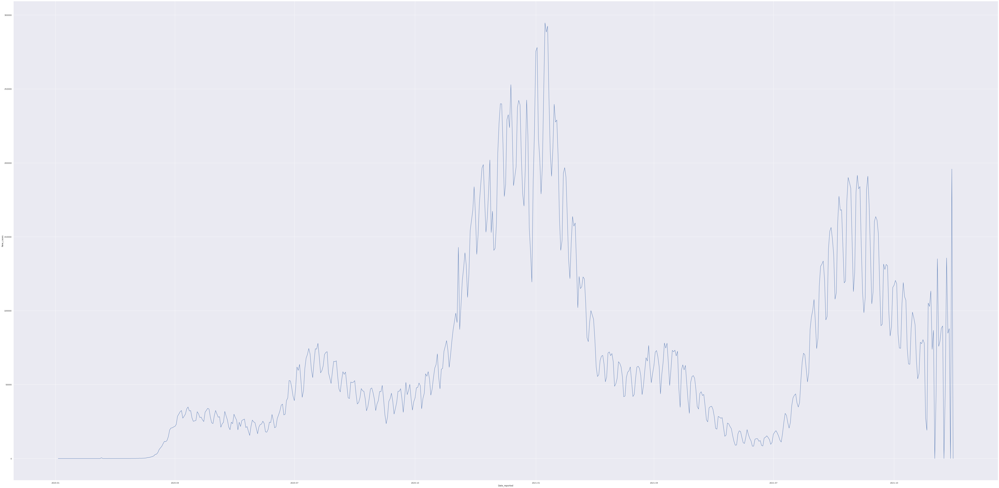

In [21]:
#Cumulative cases per date for USA

plt.figure(figsize=(100,50))
sns.lineplot(data=dbCovid[dbCovid['Country'] == 'United States of America'] , x = pd.to_datetime(dbCovid['Date_reported']) , y = dbCovid['New_cases'][dbCovid['Country'] == 'United States of America'])

<AxesSubplot:xlabel='Date_reported', ylabel='New_deaths'>

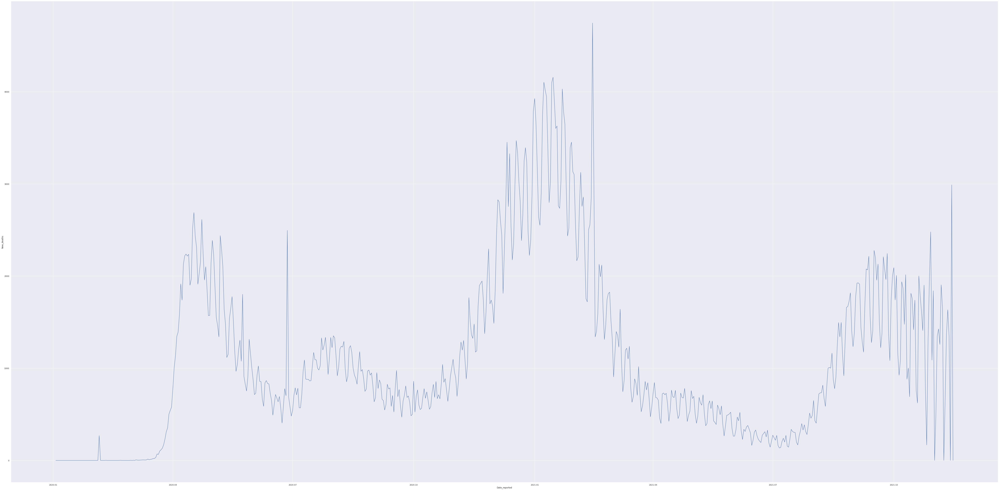

In [22]:
#Cumulative deaths per date for USA

plt.figure(figsize=(100,50))
sns.lineplot(data=dbCovid[dbCovid['Country'] == 'United States of America'] , x = pd.to_datetime(dbCovid['Date_reported']) , y = dbCovid['New_deaths'][dbCovid['Country'] == 'United States of America'])

<AxesSubplot:xlabel='Date_reported', ylabel='New_cases'>

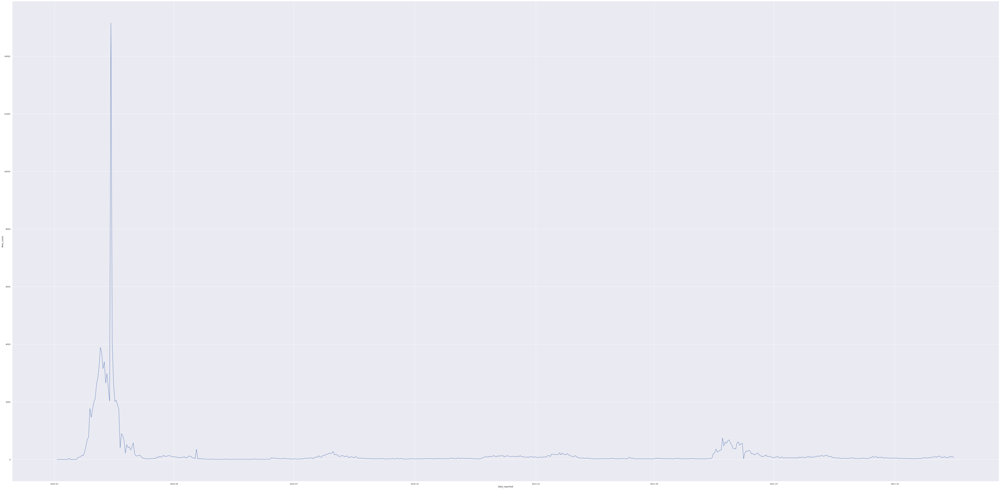

In [23]:
#Cumulative cases per date for China

plt.figure(figsize=(100,50))
sns.lineplot(data=dbCovid[dbCovid['Country'] == 'China'] , x = pd.to_datetime(dbCovid['Date_reported']) , y = dbCovid['New_cases'][dbCovid['Country'] == 'China'])


<AxesSubplot:xlabel='Date_reported', ylabel='New_cases'>

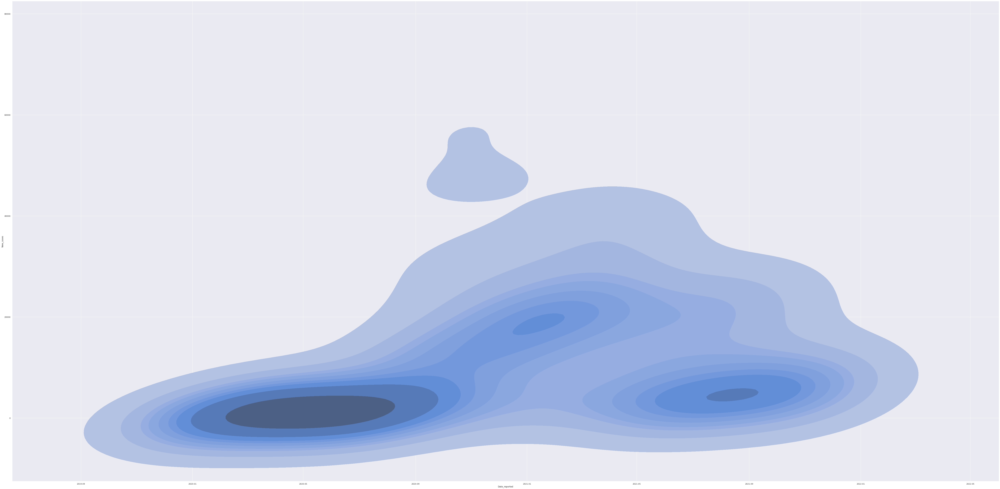

In [45]:
#Cumulative cases per date for France

plt.figure(figsize=(100,50))
sns.kdeplot(data=dbCovid[dbCovid['Country'] == 'France'] , x = pd.to_datetime(dbCovid['Date_reported']) , y = dbCovid['New_cases'][dbCovid['Country'] == 'France'] , shade=True)


<AxesSubplot:xlabel='Date_reported', ylabel='New_cases'>

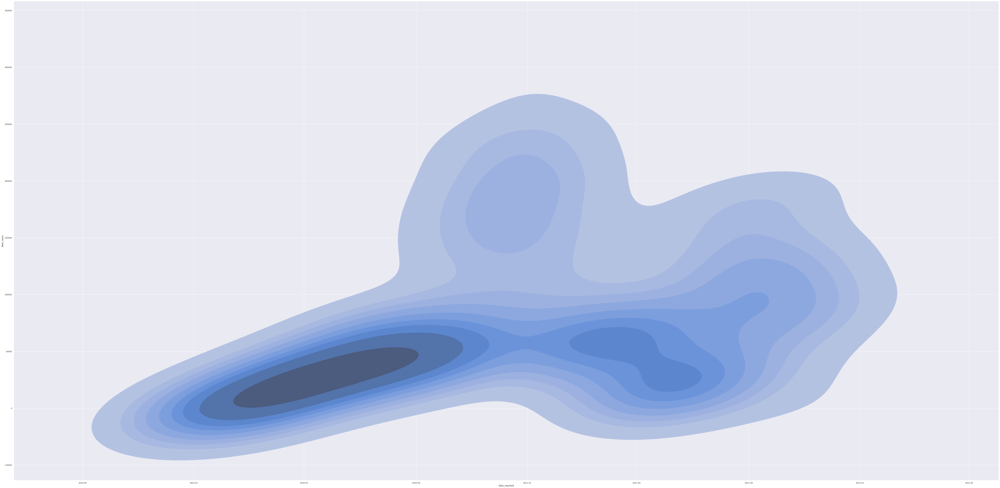

In [47]:
#Cumulative cases per date for USA

plt.figure(figsize=(100,50))
sns.kdeplot(data=dbCovid[dbCovid['Country'] == 'United States of America'] , x = pd.to_datetime(dbCovid['Date_reported']) , y = dbCovid['New_cases'][dbCovid['Country'] == 'United States of America'] , shade=True)


<AxesSubplot:xlabel='Date_reported', ylabel='New_cases'>

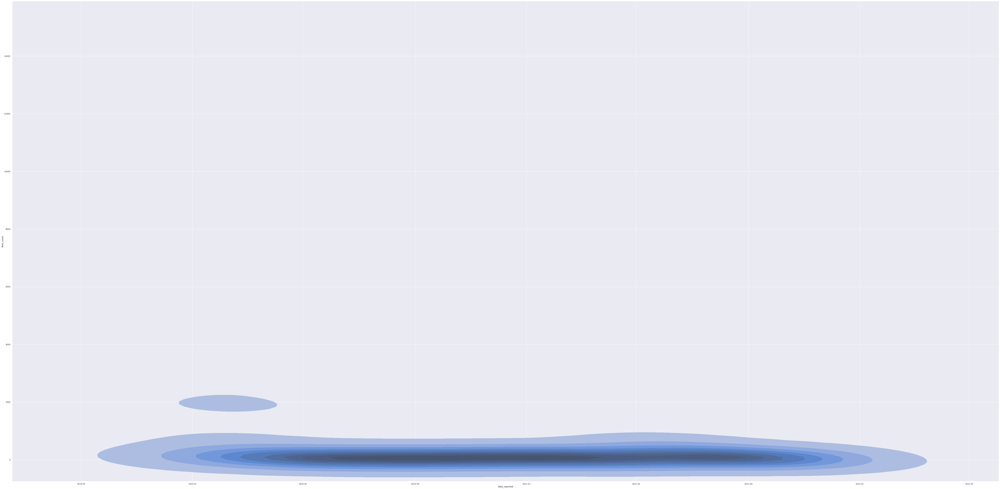

In [48]:
#Cumulative cases per date for China

plt.figure(figsize=(100,50))
sns.kdeplot(data=dbCovid[dbCovid['Country'] == 'China'] , x = pd.to_datetime(dbCovid['Date_reported']) , y = dbCovid['New_cases'][dbCovid['Country'] == 'China'] , shade=True)


In [25]:
sum_cas_par_region = dbCovid.groupby(['WHO_region'])['New_cases'].sum()
sum_cas_par_region.sort_values(ascending = False)

WHO_region
AMRO     95166611
EURO     80935417
SEARO    44289753
EMRO     16577356
WPRO      9794415
AFRO      6192778
Other         768
Name: New_cases, dtype: int64

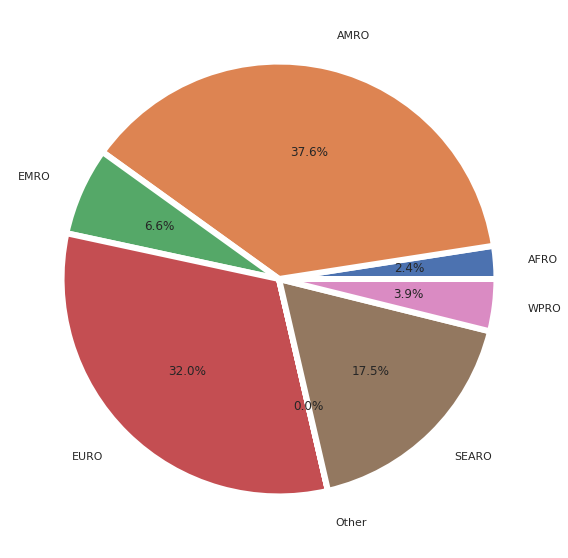

In [26]:
#Répartition des régions par nombre total de morts
plt.figure(figsize=(10 , 10))
plt.pie(sum_cas_par_region , labels = sum_cas_par_region.index , labeldistance=1.15, wedgeprops = { 'linewidth' : 6, 'edgecolor' : 'white' } , autopct='%1.1f%%' )
plt.show()

In [27]:
sum_morts_par_region = dbCovid.groupby(['WHO_region'])['New_deaths'].sum()
sum_morts_par_region.sort_values(ascending = False)

WHO_region
AMRO     2321600
EURO     1480833
SEARO     700162
EMRO      305680
AFRO      151776
WPRO      135203
Other         13
Name: New_deaths, dtype: int64

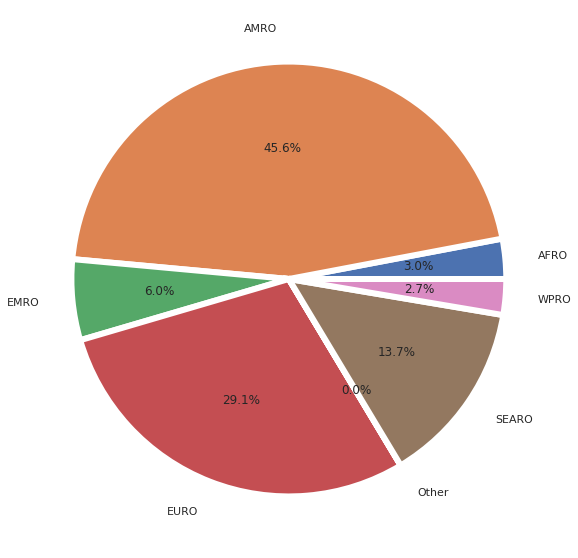

In [28]:
#Répartition des pays par nombre total de morts
plt.figure(figsize=(10 , 10))
plt.pie(sum_morts_par_region , labels = sum_morts_par_region.index , labeldistance=1.15, wedgeprops = { 'linewidth' : 6, 'edgecolor' : 'white' } , autopct='%1.1f%%' )
plt.show()

In [29]:
#Répartition du nombre total de morts dans chaque pays
sum_morts_par_pays = dbCovid.groupby(['Country'])['New_deaths'].sum()
sum_morts_par_pays = sum_morts_par_pays.sort_values(ascending= False)

<AxesSubplot:xlabel='Country'>

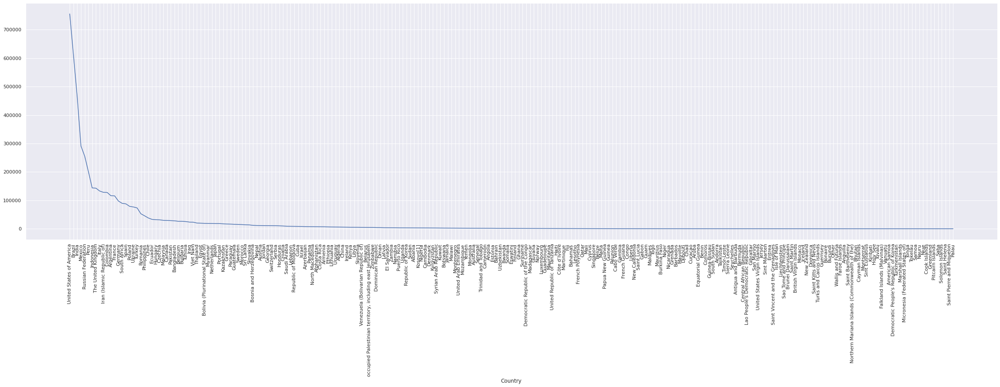

In [30]:
plt.figure(figsize=(40 , 10))
plt.xticks(rotation=90)
sns.lineplot(data = sum_morts_par_pays , x = sum_morts_par_pays.index , y = sum_morts_par_pays.values , )

<AxesSubplot:>

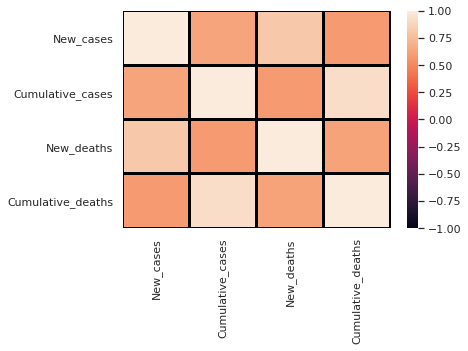

In [31]:
tests = dbCovid.corr(method='pearson')
sns.heatmap(
    data = tests , 
    vmin = -1 , 
    vmax = 1 , 
    center=None,
    robust=False,
    annot=None,
    annot_kws=None,
    linewidths=2,
    linecolor='black',
    cbar=True,
    cbar_kws=None,
    cbar_ax=None,
    square=False,
    

)

In [32]:
for i in range(5+1):
    print(i)

0
1
2
3
4
5


In [33]:
dbCovidListCountry = dbCovid["Country"].unique()

casesToll = dbCovid.groupby(['Country'])['New_deaths'].sum()

casesToll.sort_values(ascending = False)

Country
United States of America     755950
Brazil                       611222
India                        463655
Mexico                       291089
Russian Federation           255386
                              ...  
Saba                              0
Solomon Islands                   0
Saint Helena                      0
Saint Pierre and Miquelon         0
Palau                             0
Name: New_deaths, Length: 237, dtype: int64

In [34]:
'''Refaire la manip sur un fichier (comme j'ai fait avant),
et remplacer tout les espaces des noms composés par des underscore _ ,
et les espaces entre les noms par des sauts de ligne'''

"Refaire la manip sur un fichier (comme j'ai fait avant),\net remplacer tout les espaces des noms composés par des underscore _ ,\net les espaces entre les noms par des sauts de ligne"

In [35]:
file = open('test.txt' , 'w')
for i in casesToll.sort_values(ascending = False).iteritems():
    for j in range(int(i[1]/1000)):
        file.write(str(i[0]) + '~')

In [36]:
text = ""
with open('test.txt', encoding='utf-8') as f:
    text = ''.join(f.readlines())

In [37]:
text = text.replace(" " , "")
text = text.replace("(" , "")
text = text.replace(")" , "")
text = text.upper()
text

'UNITEDSTATESOFAMERICA~UNITEDSTATESOFAMERICA~UNITEDSTATESOFAMERICA~UNITEDSTATESOFAMERICA~UNITEDSTATESOFAMERICA~UNITEDSTATESOFAMERICA~UNITEDSTATESOFAMERICA~UNITEDSTATESOFAMERICA~UNITEDSTATESOFAMERICA~UNITEDSTATESOFAMERICA~UNITEDSTATESOFAMERICA~UNITEDSTATESOFAMERICA~UNITEDSTATESOFAMERICA~UNITEDSTATESOFAMERICA~UNITEDSTATESOFAMERICA~UNITEDSTATESOFAMERICA~UNITEDSTATESOFAMERICA~UNITEDSTATESOFAMERICA~UNITEDSTATESOFAMERICA~UNITEDSTATESOFAMERICA~UNITEDSTATESOFAMERICA~UNITEDSTATESOFAMERICA~UNITEDSTATESOFAMERICA~UNITEDSTATESOFAMERICA~UNITEDSTATESOFAMERICA~UNITEDSTATESOFAMERICA~UNITEDSTATESOFAMERICA~UNITEDSTATESOFAMERICA~UNITEDSTATESOFAMERICA~UNITEDSTATESOFAMERICA~UNITEDSTATESOFAMERICA~UNITEDSTATESOFAMERICA~UNITEDSTATESOFAMERICA~UNITEDSTATESOFAMERICA~UNITEDSTATESOFAMERICA~UNITEDSTATESOFAMERICA~UNITEDSTATESOFAMERICA~UNITEDSTATESOFAMERICA~UNITEDSTATESOFAMERICA~UNITEDSTATESOFAMERICA~UNITEDSTATESOFAMERICA~UNITEDSTATESOFAMERICA~UNITEDSTATESOFAMERICA~UNITEDSTATESOFAMERICA~UNITEDSTATESOFAMERICA~UNITEDSTA

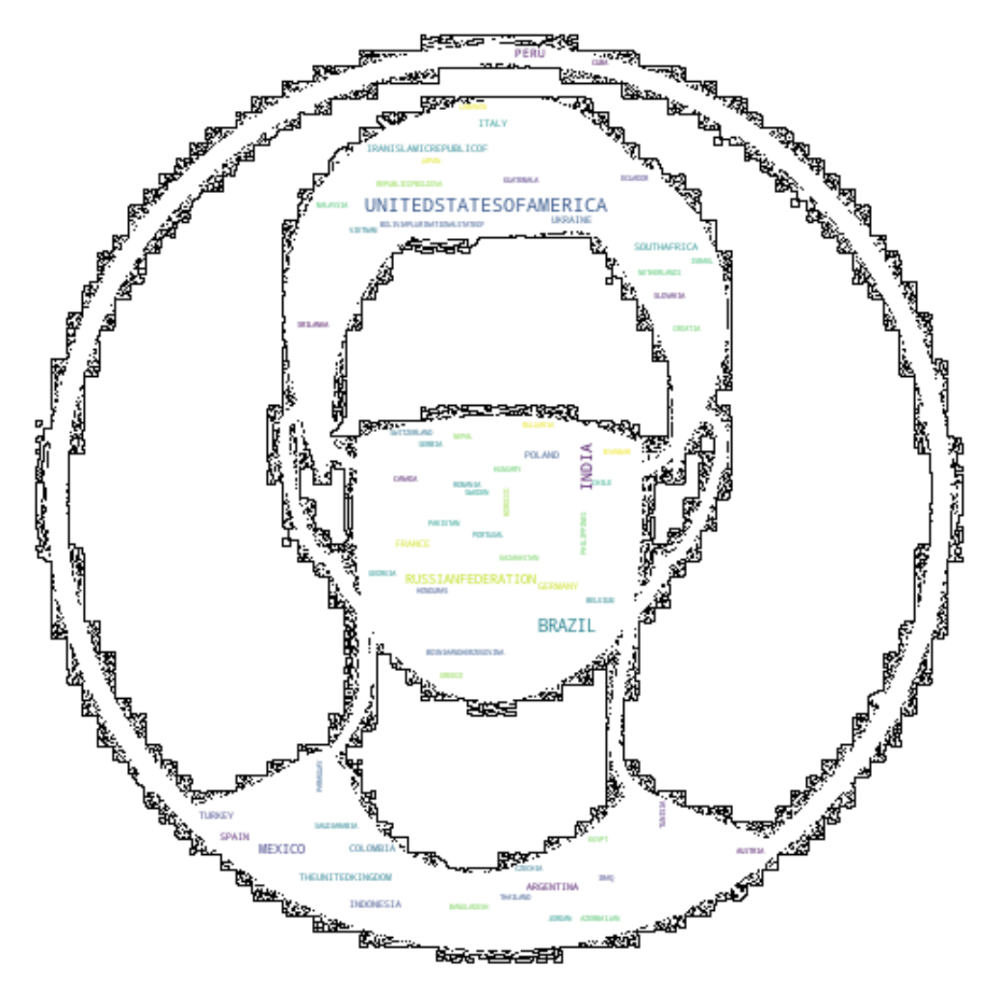

In [38]:
custom_mask = np.array(Image.open("unnamed.jpg"))
plt.figure(figsize= (20 ,20))
wordcloud = WordCloud(background_color = 'white', max_words = 1000 , mask= custom_mask, contour_width=0.3, contour_color='black', max_font_size=10, collocations=False).generate(text)
plt.imshow(wordcloud , interpolation='bilinear')
plt.axis("off")
plt.show()

<AxesSubplot:xlabel='Cumulative_cases', ylabel='Cumulative_deaths'>

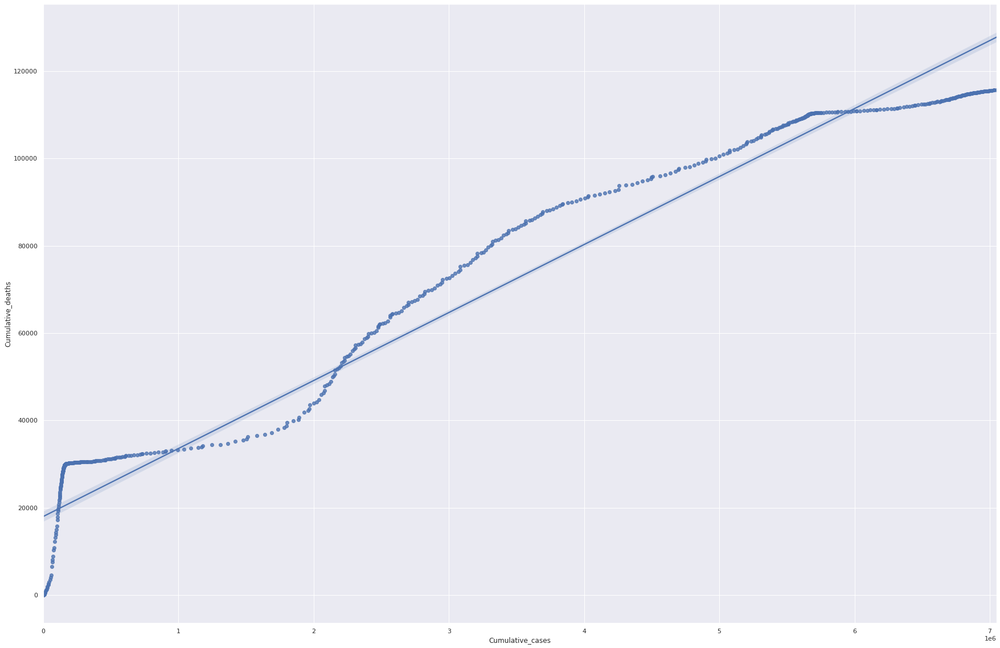

In [39]:
#Correlation entre le nombre de cas cummulé et le nombre de morts cummulé en France
plt.figure(figsize= (30 , 20))
sns.regplot(x = dbCovid['Cumulative_cases'][dbCovid['Country'] == 'France'] , y = dbCovid['Cumulative_deaths'][dbCovid['Country'] == 'France'])

<AxesSubplot:xlabel='Cumulative_cases', ylabel='Cumulative_deaths'>

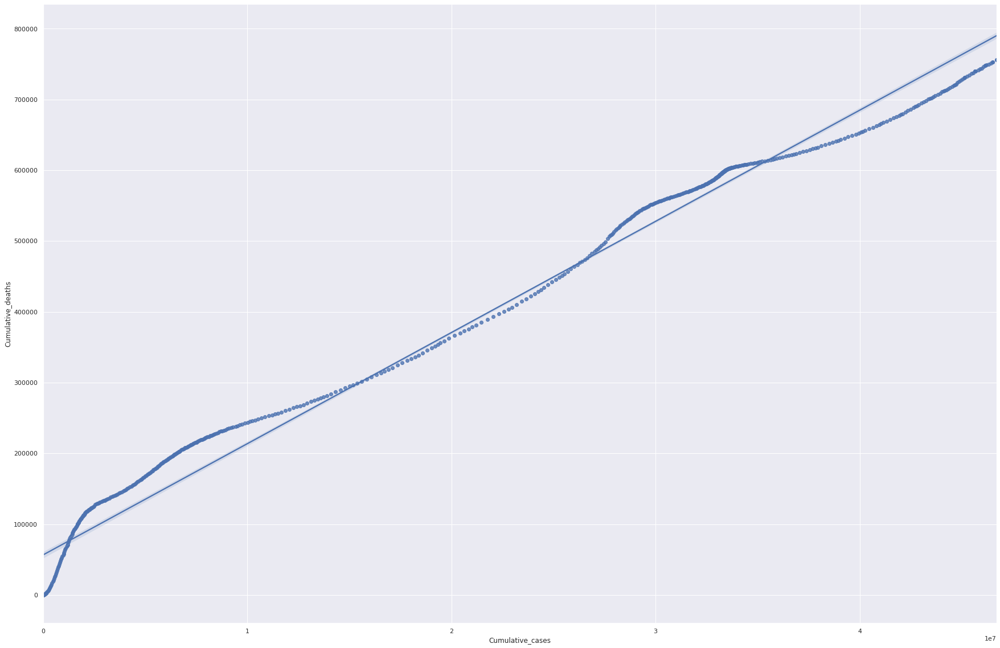

In [40]:
#Correlation entre le nombre de cas cummulé et le nombre de morts cummulé en France
plt.figure(figsize= (30 , 20))
sns.regplot(x = dbCovid['Cumulative_cases'][dbCovid['Country'] == 'United States of America'] , y = dbCovid['Cumulative_deaths'][dbCovid['Country'] == 'United States of America'])

In [49]:
#Regions with the highest cases toll
dbcovidRegion = dbCovid["WHO_region"].unique()
toll_max = dbCovid.groupby(['WHO_region'])['New_cases'].max()
toll_max

WHO_region
AFRO      31328
AMRO     294668
EMRO      50228
EURO      81519
Other        99
SEARO    414188
WPRO      26238
Name: New_cases, dtype: int64

In [50]:
#Regions with the highest death toll
dbcovidRegion = dbCovid["WHO_region"].unique()
toll_max = dbCovid.groupby(['WHO_region'])['New_deaths'].max()
toll_max

WHO_region
AFRO      844
AMRO     8786
EMRO      709
EURO     2291
Other       2
SEARO    6148
WPRO     1290
Name: New_deaths, dtype: int64

In [51]:
#Regions with the lowest cases toll
dbcovidRegion = dbCovid["WHO_region"].unique()
toll_min = dbCovid.groupby(['WHO_region'])['New_cases'].min()
toll_min

WHO_region
AFRO     0
AMRO     0
EMRO     0
EURO     0
Other    0
SEARO    0
WPRO     0
Name: New_cases, dtype: int64

In [52]:
#Regions with the lowest death toll
dbcovidRegion = dbCovid["WHO_region"].unique()
toll_min = dbCovid.groupby(['WHO_region'])['New_deaths'].min()
toll_min

WHO_region
AFRO     0
AMRO     0
EMRO     0
EURO     0
Other    0
SEARO    0
WPRO     0
Name: New_deaths, dtype: int64

In [53]:
dbCovidListCountry = dbCovid["WHO_region"].unique()

casesToll = dbCovid.groupby(['WHO_region'])['New_cases'].sum()

casesToll.sort_values(ascending = False)

WHO_region
AMRO     95166611
EURO     80935417
SEARO    44289753
EMRO     16577356
WPRO      9794415
AFRO      6192778
Other         768
Name: New_cases, dtype: int64

<AxesSubplot:xlabel='WHO_region', ylabel='New_deaths'>

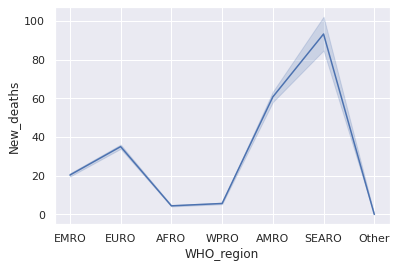

In [54]:
sns.lineplot(data=dbCovid,x="WHO_region",y="New_deaths")

In [55]:
###find the Country with earliest deaths
country_df_earliest = pd.DataFrame(dbCovid.groupby(['Date_reported','Country'])['New_deaths'].all())
# remove all new_deaths = false 
country_df_earliest = country_df_earliest.loc[country_df_earliest.New_deaths == True]
country_df_earliest.head(1)

,,New_deaths
Date_reported,Country,
2020-01-12,China,True


In [56]:
# Region with the earliest report of a new death 
region_df_earliest_death = pd.DataFrame(dbCovid.groupby(['Date_reported','Country','WHO_region'])['New_deaths'].all())
# remove all new_deaths = false 
region_df_earliest_death = region_df_earliest_death.loc[region_df_earliest_death.New_deaths == True]
region_df_earliest_death.head(1)

,,,New_deaths
Date_reported,Country,WHO_region,
2020-01-12,China,WPRO,True


In [57]:
# Region with the earliest report of a new case 
region_df_earliest = pd.DataFrame(dbCovid.groupby(['Date_reported','Country','WHO_region'])['New_cases'].all())
# remove all new_deaths = false 
region_df_earliest = region_df_earliest.loc[region_df_earliest.New_cases == True]
region_df_earliest.head(1)

,,,New_cases
Date_reported,Country,WHO_region,
2020-01-04,China,WPRO,True


<AxesSubplot:ylabel='Country'>

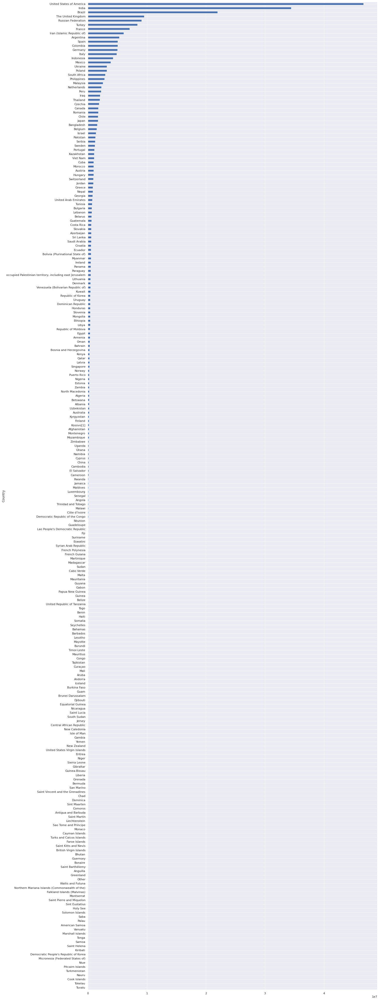

In [58]:
dbCovid.groupby('Country')['New_cases'].sum().sort_values(ascending=True).plot(kind='barh',figsize=(20,70))

# df.plot(kind='barh',figsize=(20,70))
#.plot(kind='barh',figsize=(20,70))

<AxesSubplot:xlabel='Date_reported', ylabel='New_cases'>

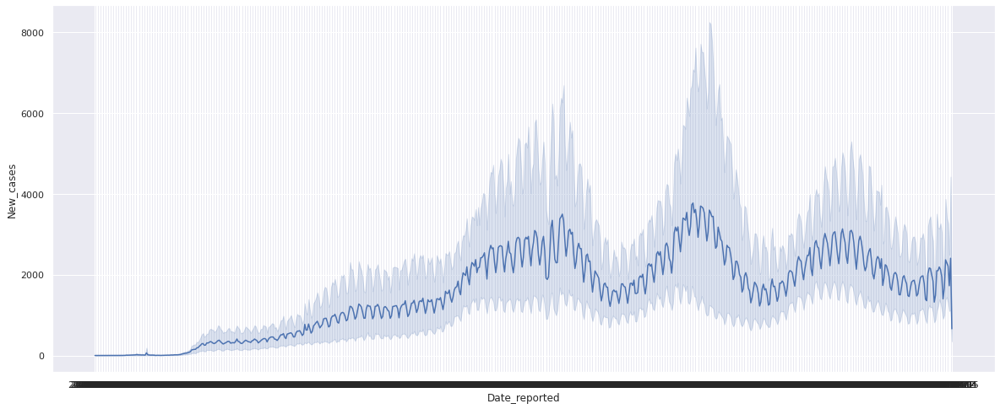

In [59]:
# Periods of time when propagation was stagnant
sns.set(rc = {'figure.figsize':(20,8)})
sns.lineplot(data=dbCovid, x="Date_reported", y="New_cases")

In [60]:
# Jad 1 Highest peaks in new cases per date per country

dbCovidListCases = dbCovid["New_cases"].unique()

casesToll = dbCovid[['Date_reported', 'Country', 'New_cases']]

casesResult = casesToll.sort_values(by='New_cases', ascending = False)

casesResult[casesResult['Country'] == 'India'].head(100)

# France, USA, Russia, China, India

#France : Octobre 2020, Novembre 2020, Mars 2021, Avril 2021, Aout 2021

#USA : Novembre 2020, Decembre 2020, Janvier 2021, Aout 2021, Novembre 2021

#Russia : Decembre 2020, Octobre 2021, Novembre 2021

#China : Janvier 2020, Fevrier 2020, Mars 2020, Mai 2021, Juin 2021

#India : Avril 2021, Mai 2021






#++ Convertir en date (ToDateTime) + graph, pd.to_date_time(dbCovid['Date_reported']).dt.year()

,Date_reported,Country,New_cases
66009,2021-05-07,India,414188
66008,2021-05-06,India,412262
66011,2021-05-09,India,403738
66003,2021-05-01,India,401993
66010,2021-05-08,India,401078
...,...,...,...
65788,2020-09-28,India,82170
65792,2020-10-02,India,81484
65974,2021-04-02,India,81466
66046,2021-06-13,India,80834


In [61]:
# Jad 1 Lowest peaks in new cases per date per country

dbCovidListCases = dbCovid["New_cases"].unique()

dbCovid['New_cases'] = dbCovid['New_cases'].astype(int)

casesToll = dbCovid[dbCovid['New_cases'] > 0]

casesToll = casesToll[['Date_reported', 'Country', 'New_cases']]

casesResult = casesToll.sort_values(by='New_cases', ascending = True)

casesResult[casesResult['Country'] == 'China'].head(100)


# France, USA, Russia, China, India

#France : Janvier 2020, Fevrier 2020, Mai 2020, Juin 2020, Octobre 2021

#USA : Janvier 2020, Fevrier 2020, Juin 2020, Juillet 2021

#Russia : Janvier 2020, Mars 2020, Avril 2020, Juillet 2020

#China : Janvier 2020, Mai 2020, Juin 2020, Fevrier 2021, Mars 2021, Avril 2021, Mai 2021

#India : Janvier 2020, Fevrier 2020, Mars 2020, Juin 2020, Janvier 2021, Fevrier 2021

,Date_reported,Country,New_cases
28794,2020-05-09,China,1
28797,2020-05-12,China,1
28668,2020-01-04,China,1
28812,2020-05-27,China,1
28820,2020-06-04,China,1
...,...,...,...
29155,2021-05-05,China,19
29147,2021-04-27,China,19
29146,2021-04-26,China,20
29080,2021-02-19,China,20


In [62]:
# Jad 2 Highest peaks in new deaths per date per country

dbCovidListDeaths = dbCovid["New_deaths"].unique()

deathsToll = dbCovid[['Date_reported', 'Country', 'New_deaths']]

deathsResult = deathsToll.sort_values(by='New_deaths', ascending = False)

deathsResult[deathsResult['Country'] == 'Ireland'].head(100)

# France, USA, Russia, China, India

#France : Avril 2020, Novembre 2020, Decembre 2020, Janvier 2021, Mars 2021, Avril 2021

#USA : Decembre 2020, Janvier 2021, Fevrier 2021

#Russia : Septembre 2021, Octobre 2021, Novembre 2021

,Date_reported,Country,New_deaths
68366,2020-04-27,Ireland,219
68648,2021-02-03,Ireland,101
68649,2021-02-04,Ireland,94
68634,2021-01-20,Ireland,92
68641,2021-01-27,Ireland,88
...,...,...,...
68340,2020-04-01,Ireland,17
68621,2021-01-07,Ireland,17
68660,2021-02-15,Ireland,17
68374,2020-05-05,Ireland,16


In [63]:
# Jad 2 Lowest peaks in new deaths per date per country

dbCovidListCases = dbCovid["New_deaths"].unique()

dbCovid['New_deaths'] = dbCovid['New_deaths'].astype(int)

deathsToll = dbCovid[dbCovid['New_deaths'] > 0]

deathsToll = deathsToll[['Date_reported', 'Country', 'New_deaths']]

deathsResult = deathsToll.sort_values(by='New_deaths', ascending = True)

deathsResult[deathsResult['Country'] == 'China'].head(100)


# 3 pays avec un cas moindre de morts (moins de 10000) : Afghanistan, Iraq, Ireland, Indonesia, Iceland

,Date_reported,Country,New_deaths
29283,2021-09-10,China,1
29284,2021-09-11,China,1
29287,2021-09-14,China,1
29293,2021-09-20,China,1
29296,2021-09-23,China,1
...,...,...,...
28871,2020-07-25,China,1
28875,2020-07-29,China,1
28876,2020-07-30,China,1
28923,2020-09-15,China,1


In [64]:
# Jad 3 Highest peaks in new cases per date per region

dbCovidListCases = dbCovid["New_cases"].unique()

casesToll = dbCovid[['Date_reported', 'WHO_region', 'New_cases']]

casesResult = casesToll.sort_values(by='New_cases', ascending = False)

casesResult[casesResult['WHO_region'] == 'WPRO'].head(100)

# SEARO, AFRO, EURO, EMRO, WPRO

#SEARO : Avril 2021, Mai 2021

#AFRO : Juillet 2020, Decembre 2020, Janvier 2021, Juin 2021, Juillet 2021, Aout 2021

#EURO : Octobre 2020, Novembre 2020, Decembre 2020, Janvier 2021, Mars 2021, Avril 2021, Juillet 2021, Octobre 2021, Novembre 2021

#EMRO : Avril 2021, Juillet 2021, Aout 2021, Septembre 2021

#WPRO : Aout 2021, Septembre 2021

,Date_reported,WHO_region,New_cases
113233,2021-09-12,WPRO,26238
72264,2021-08-27,WPRO,26050
72257,2021-08-20,WPRO,25328
72259,2021-08-22,WPRO,25144
72258,2021-08-21,WPRO,24955
...,...,...,...
72272,2021-09-04,WPRO,16850
85884,2021-07-31,WPRO,16840
113247,2021-09-26,WPRO,16835
72269,2021-09-01,WPRO,16826


In [65]:
# Jad 3 Lowest peaks in new cases per date per region

dbCovidListCases = dbCovid["New_cases"].unique()

dbCovid['New_cases'] = dbCovid['New_cases'].astype(int)

casesToll = dbCovid[dbCovid['New_cases'] > 0]

casesToll = casesToll[['Date_reported', 'WHO_region', 'New_cases']]

casesResult = casesToll.sort_values(by='New_cases', ascending = True)

casesResult[casesResult['WHO_region'] == 'WPRO'].head(100)

# SEARO, AFRO, EURO, EMRO, WPRO

#SEARO : Mars 2020, Avril 2020, Mai 2020, Aout 2020, Janvier 2021, Octobre 2021, Novembre 2021

#AFRO : Mars 2020, Avril 2020, Juin 2020, Septembre 2020

#EURO : Mai 2020, Juin 2020, Juillet 2020, Fevrier 2021, Avril 2021

#WPRO : Janvier 2021, Avril 2021, Mai 2021, Juin 2021

,Date_reported,WHO_region,New_cases
101495,2021-05-04,WPRO,1
101481,2021-04-20,WPRO,1
101477,2021-04-16,WPRO,1
101504,2021-05-13,WPRO,1
101503,2021-05-12,WPRO,1
...,...,...,...
58512,2021-05-17,WPRO,1
101532,2021-06-10,WPRO,1
58518,2021-05-23,WPRO,1
100704,2021-01-16,WPRO,1


In [66]:
# Jad 4 Highest peaks in new deaths per date per region

dbCovidListDeaths = dbCovid["New_deaths"].unique()

deathsToll = dbCovid[['Date_reported', 'WHO_region', 'New_deaths']]

deathsResult = deathsToll.sort_values(by='New_deaths', ascending = False)

deathsResult[deathsResult['WHO_region'] == 'WPRO'].head(100)

# SEARO, AFRO, EURO, EMRO, WPRO

#SEARO : Septembre 2020, Avril 2021, Mai 2021, Juin 2021, Juillet 2021

#AFRO : Septembre 2020, Decembre 2020, Janvier 2021, Fevrier 2021, Juillet 2021, Aout 2021, Septembre 2021

#EURO : Mars 2020, Avril 2020, Decembre 2020, Janvier 2021, Mars 2021, Octobre 2021

#EMRO : Decembre 2020, Avril 2021, Mai 2021, Aout 2021

#WPRO : Avril 2020, Septembre 2020, Aout 2021, Septembre 2021

,Date_reported,WHO_region,New_deaths
28773,2020-04-18,WPRO,1290
158954,2021-09-02,WPRO,804
158944,2021-08-23,WPRO,737
85927,2021-09-12,WPRO,592
158924,2021-08-03,WPRO,575
...,...,...,...
112871,2020-09-15,WPRO,259
85943,2021-09-28,WPRO,258
113210,2021-08-20,WPRO,258
85889,2021-08-05,WPRO,257


In [67]:
# Jad 4 Lowest peaks in new deaths per date per region

dbCovidListDeaths = dbCovid["New_deaths"].unique()

dbCovid['New_deaths'] = dbCovid['New_deaths'].astype(int)

deathsToll = dbCovid[dbCovid['New_deaths'] > 0]

deathsToll = deathsToll[['Date_reported', 'WHO_region', 'New_deaths']]

deathsResult = deathsToll.sort_values(by='New_deaths', ascending = True)

deathsResult[deathsResult['WHO_region'] == 'WPRO'].head(100)

# SEARO, AFRO, EURO, EMRO, WPRO

#SEARO : Mars 2020, Octobre 2021, Novembre 2021

#AFRO : Avril 2020, Fevrier 2021, Aout 2021, Novembre 2021

#EURO : Mars 2020, Fevrier 2021, Aout 2021, Septembre 2021

#EMRO : Mars 2020, Avril 2020, Decembre 2020

#WPRO : Juin 2020, Juillet 2020, Mars 2021, Mai 2021, Juin 2021

,Date_reported,WHO_region,New_deaths
71832,2020-06-21,WPRO,1
71837,2020-06-26,WPRO,1
71840,2020-06-29,WPRO,1
71843,2020-07-02,WPRO,1
71844,2020-07-03,WPRO,1
...,...,...,...
58450,2021-03-16,WPRO,1
58500,2021-05-05,WPRO,1
58501,2021-05-06,WPRO,1
58502,2021-05-07,WPRO,1


In [68]:
# Jad 5 Countries with the highest death toll

dbCovidListCountry = dbCovid["Country"].unique()

deathToll = dbCovid.groupby(['Country'])['New_deaths'].sum()


deathTollSorted = deathToll.sort_values(ascending = False)

deathTollSorted

Country
United States of America     755950
Brazil                       611222
India                        463655
Mexico                       291089
Russian Federation           255386
                              ...  
Saba                              0
Solomon Islands                   0
Saint Helena                      0
Saint Pierre and Miquelon         0
Palau                             0
Name: New_deaths, Length: 237, dtype: int64

In [69]:
# Jad 6 Countries with the highest cases toll

dbCovidListCountry = dbCovid["Country"].unique()

casesToll = dbCovid.groupby(['Country'])['New_cases'].sum()

casesToll.sort_values(ascending = False)

Country
United States of America    46697360
India                       34447541
Brazil                      21954411
The United Kingdom           9524975
Russian Federation           9070674
                              ...   
Kiribati                           0
Niue                               0
Saint Helena                       0
Nauru                              0
Tuvalu                             0
Name: New_cases, Length: 237, dtype: int64

In [70]:
# Jad 7 Countries with the lowest death toll

deathToll[deathToll == 0]

deathToll

Country
Afghanistan                                                 7293
Albania                                                     2986
Algeria                                                     5979
American Samoa                                                 0
Andorra                                                      130
                                                            ... 
Wallis and Futuna                                              7
Yemen                                                       1923
Zambia                                                      3664
Zimbabwe                                                    4697
occupied Palestinian territory, including east Jerusalem    4754
Name: New_deaths, Length: 237, dtype: int64

In [71]:
# Jad 8 Countries with the lowest cases toll

casesToll

#dbCovid[dbCovid['Cumulative_cases'].max() > 0].sort_values('New_cases', ascending = True).head(50)

Country
Afghanistan                                                 156554
Albania                                                     192600
Algeria                                                     207873
American Samoa                                                   5
Andorra                                                      15819
                                                             ...  
Wallis and Futuna                                              454
Yemen                                                         9918
Zambia                                                      209974
Zimbabwe                                                    133428
occupied Palestinian territory, including east Jerusalem    457154
Name: New_cases, Length: 237, dtype: int64